# Parametric Gaussian Regression

This example is inspired by Chapter 4.1 _Regression_ from _Probabilistic Numerics_ written by Phillip Hennig, Michael A. Osborn, Hans P. Kersting.
The code and the narrative in this notebook is written by Dmitry Bagaev [GitHub](github.com/bvdmitri), [LinkedIn](linkedin.com/bvdmitri). Some explanations were directly copied from the content of the book.

In [154]:
# Import all required packages for this example
using RxInfer, StableRNGs, LinearAlgebra, Plots, DataFrames

Gaussian distributions (multivariate) assign probability density to vectors of real numbers. In numerical applications, the objects of interest are often the output of real-valued functions $f : \mathbb{X} \rightarrow R$ over some input domain $\mathbb{X}$. A straightforward but powerful way to use the Gaussian inference framework on such functions is to make the assumption that $f$ can be written as a weighted sum over a finite number $F$ of feature functions $[\phi_i : \mathbb{X} \rightarrow \mathbb{R}]_{i=1,..,F}$:

$$\begin{align}
f(x) = \sum_{i=1}^{F} \phi_i(x)\omega_i =: \Phi^T_x \omega \,\,\, \mathrm{where} \,\, \omega \in \mathbb{R}^F
\end{align}$$

The crucial algebraic property of this equation is that it models $f$ as a linear function of the weights $\omega$. It is therefore called a _linear regression model_. To perform inference on such a function, we assign a Gaussian density over the possible values for the weight vector $\omega$, written

$$\begin{align}
p(\omega) = \mathcal{N}(\omega \vert \mu, \Sigma)
\end{align}$$

## Dataset 

Let us assume that it is possible to collect observations $Y := [y_1, \cdots , y_N ] \in \mathbb{R}$ of $f$ corrupted by Gaussian noise with co-variance $\Lambda ∈ \mathbb{R}^{N×N}$ at the locations $X$.

In [156]:
N = 40
Λ = I
X = range(-8, 8, length=N)

rng = StableRNG(42)

# Arbitrary non-linear function, which is hidden
f(x) = -((-x / 3)^3 - (-x / 2)^2 + x + 10) 

Y = rand(rng, MvNormalMeanCovariance(f.(X), Λ))

# Can be loaded from a file or a database
df = DataFrame(X = X, Y = Y)

Row,X,Y
,Float64,Float64
1,-8.0,-5.63321
2,-7.58974,-3.75472
3,-7.17949,-2.26681
4,-6.76923,-1.95387
5,-6.35897,-2.92934
6,-5.94872,-2.31714
7,-5.53846,-4.10432
8,-5.12821,-4.08565
9,-4.71795,-1.83209


### Train & test datasets

From this dataset we are going to form 3 datasets using different portions as _train_ datasets and _test_ datasets respectively, where dataset number:
1. Uses first half as _train_ dataset and second half as _test_ dataset
2. Uses first hals as _test_ dataset and second half as _train_ dataset
3. Uses first quarter and half quarter as _train_ dataset and the rest as _test_ dataset

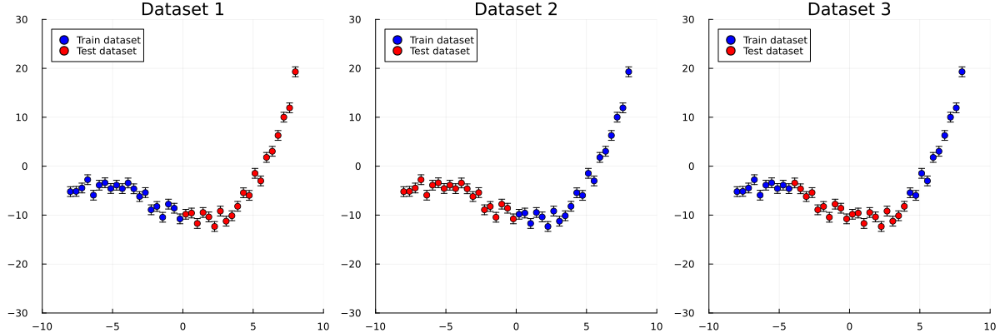

In [158]:
dataset_1 = (
    y_train = y[1:(N ÷ 2)], x_train = x[1:(N ÷ 2)],
    y_test = y[(N ÷ 2 +1):N], x_test = x[(N ÷ 2 +1):N]
)

dataset_2 = (
    y_test = y[1:(N ÷ 2)], x_test = x[1:(N ÷ 2)],
    y_train = y[(N ÷ 2 +1):N], x_train = x[(N ÷ 2 +1):N]
)

dataset_3 = (
    y_train = [ y[1:(N ÷ 4)]..., y[(3N ÷ 4 +1):N]... ], x_train = [ x[1:(N ÷ 4)]..., x[(3N ÷ 4 +1):N]... ],
    y_test = y[(N ÷ 4 +1):(3N ÷ 4)], x_test = x[(N ÷ 4 +1):(3N ÷ 4)]
)

datasets = [ dataset_1, dataset_2, dataset_3 ]

ps = map(enumerate(datasets)) do (i, dataset)
    p = plot(xlim = (-10, 10), ylim = (-30, 30), title = "Dataset $i")
    scatter!(p, dataset[:x_train], dataset[:y_train], yerror=Λ, label = "Train dataset", color = :blue)
    scatter!(p, dataset[:x_test], dataset[:y_test], yerror=Λ, label = "Test dataset", color = :red)
    return p
end

plot(ps..., size = (1200, 400), layout = @layout([ a b c ]))

This provides a set of nonlinear data set with i.i.d. Gaussian observation noise, where we set $Λ = I$. 

## Inference with RxInfer

The goal here is to estimate probability distribution over $\omega$ given a set of basic functions $\phi$ together with datasets $X$ and $Y$. To achieve this goal we write a probabilityic generative _model_ using the `@model` macro from `RxInfer` package. This model could look as simple as:

In [162]:
@model function parametric_regression(ϕs, x, y, μ, Σ, Λ)
    ω  ~ MvNormal(mean = μ, covariance = Σ)                        # prior over ω
    Φₓ = [ ϕs[i](x[j]) for j in eachindex(x), i in eachindex(ϕs) ] # see eq. above
    y  ~ MvNormal(mean = Φₓ * ω, covariance = Λ)                   # likelihood function 
end

Here in the model we used:
- $\phi$ argument holds a collection of basic function $\phi_i$
- $x$ argument holds locations $X$
- $y$ argument holds noisy evaluations of function $f$ at locations $X$
- $\mu$ specifies mean of the prior distribution of $\omega$
- $\Sigma$ specifies covariance of the prior distribution of $\omega$
- $\Lambda$ specifies covariance of the Gaussian noise for observations $y$ 

To use this model we combine it together with the `infer` function, e.g:

In [164]:
function infer_ω(; ϕs, x, y)
    # Create probabilistic model, 
    # RxInfer will construct the graph of this model auutomatically
    model = parametric_regression(
        ϕs = ϕs, 
        μ  = zeros(length(ϕs)),
        Σ  = I,
        Λ  = I,
        x  = x
    )

    # Let RxInfer do all the math for you
    result = infer(
        model = model, 
        data  = (y = y,)
    )

    # Return posterior over ω
    return result.posteriors[:ω]
end

infer_ω (generic function with 1 method)

## Results for different basis functions

The result will largely depend on the choice of basis functions $\phi_i$, lets explore how different choices of $\phi_i$ affect the results for different datasets.
We first, write a simple generic function that would iterate over different datasets and execute inference for each of them and conveniently plot the aggregated results.

In [165]:
function plot_inference_results_for(; ϕs, datasets, title = "", rng = StableRNG(42))
    p1 = plot(title="Base with $(title)", xlabel="x", xlim=(-5, 5), ylim=(-10, 10), legend=:outertopleft)

    # First plot our basis functions
    plot_ϕ!(p1, ϕs, color=:gray, labels = [ "ϕ$i" for _ in 1:1, i in 1:length(ϕs) ])
    # And add some examples for different random choices of ω
    plot_ϕ!(p1, ϕs, randn(rng, length(ϕs), 3), linewidth=2)

    # For each dataset
    ps = map(enumerate(datasets)) do (i, dataset)
        p2 = plot(title="$(title) on dataset #$(i)", xlabel="x", xlim=(-10, 10), ylim=(-25, 25))

        # We infer posterior distribution over ω
        ωs = infer_ω(ϕs = ϕs, x = dataset[:x_train], y = dataset[:y_train])

        # And plot mean of it
        plot_ϕ!(p2, ϕs, mean(ωs), linewidth=2, color=:green, labels="Inferred ω with RxInfer")
        # As well as random samples from the posterior
        plot_ϕ!(p2, ϕs, rand(ωs, 15), linewidth=2, color=:gray, opacity=0.25, labels=nothing)
        # Together with test/train dataset
        scatter!(p2, dataset[:x_train], dataset[:y_train], yerror=Λ, label="train", color=:blue)
        scatter!(p2, dataset[:x_test], dataset[:y_test], yerror=Λ, label="test", color=:red)

        return p2
    end

    # Aggregate everything together
    plot(p1, ps..., size=(1000, 800))
end

# Helper function to plot basis function `ϕs`
function plot_ϕ!(p, ϕs; kwargs...)
    xs = range(-10, 10, length=100)
    ys = [ ϕ(x) for x in xs, ϕ in ϕs  ]
    plot!(p, xs, ys; kwargs...)
end

# Helper function to plot function `f` 
# - using basis functions `ϕs``
# - for particular choices of `ωs`
function plot_ϕ!(p, ϕs, ωs; kwargs...)
    xs = range(-10, 10, length=100)
    ys = [ ϕ(x) for x in xs, ϕ in ϕs  ]
    yr = ys * ωs
    labels = [ "rand ω$i" for _ in 1:1, i in 1:length(ωs) ]
    plot!(p, xs, yr, labels = labels; kwargs...)
end

plot_ϕ! (generic function with 2 methods)

Ok, we are done with the most boring part of this demo (plotting functions). In fact, you can see that code for plotting the results took more code than the inference code! Let's proceed with the fun part! 

## Polynomials

One possible choice for the basis functions $\phi_i$ can be polynomials in the form of:

$$\begin{align}
\phi_i(x) = x^i
\end{align}$$

Let's see how RxInfer (efficiently!) infers the posterior over $\omega$ for this particular choice of basis functions. 

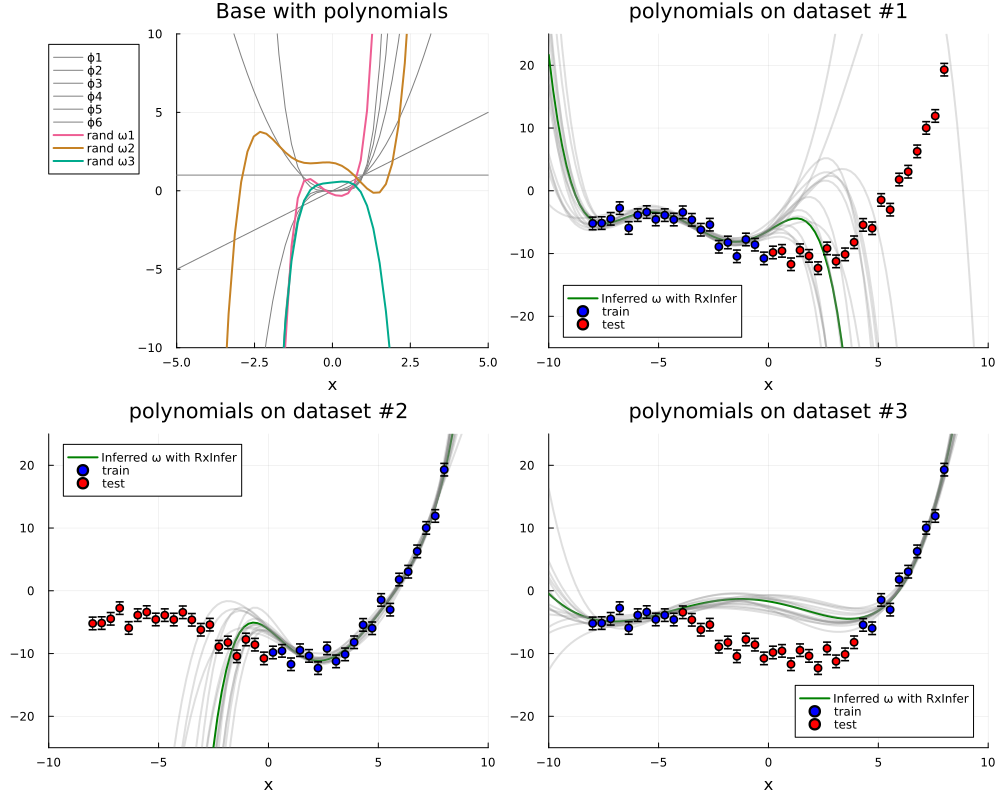

In [176]:
plot_inference_results_for(
    title    = "polynomials",
    datasets = datasets,
    ϕs       = [ (x) -> x ^ i for i in 0:5 ], 
)

The first plot shows how our basis functions look like (in gray) together with some possible representations of $f$ with some random values of $\omega$. Other plots show the inference results using different datasets. We can indeed confirm that using different train and test sets influences the result. Let's explore other potential choices for the basis functions $\phi_i$!

## Trigonometrics

Another standard choice for the basis functions are trigonometric functions such as `sin` and `cos`:

$$\begin{align}
\phi_i(x) &= \mathrm{sin}(\frac{x}{i}) 
\end{align}$$

$$\begin{align}
\phi_i(x) &= \mathrm{cos}(\frac{x}{i})
\end{align}$$

First lets try `sin` for $i = 1:5$

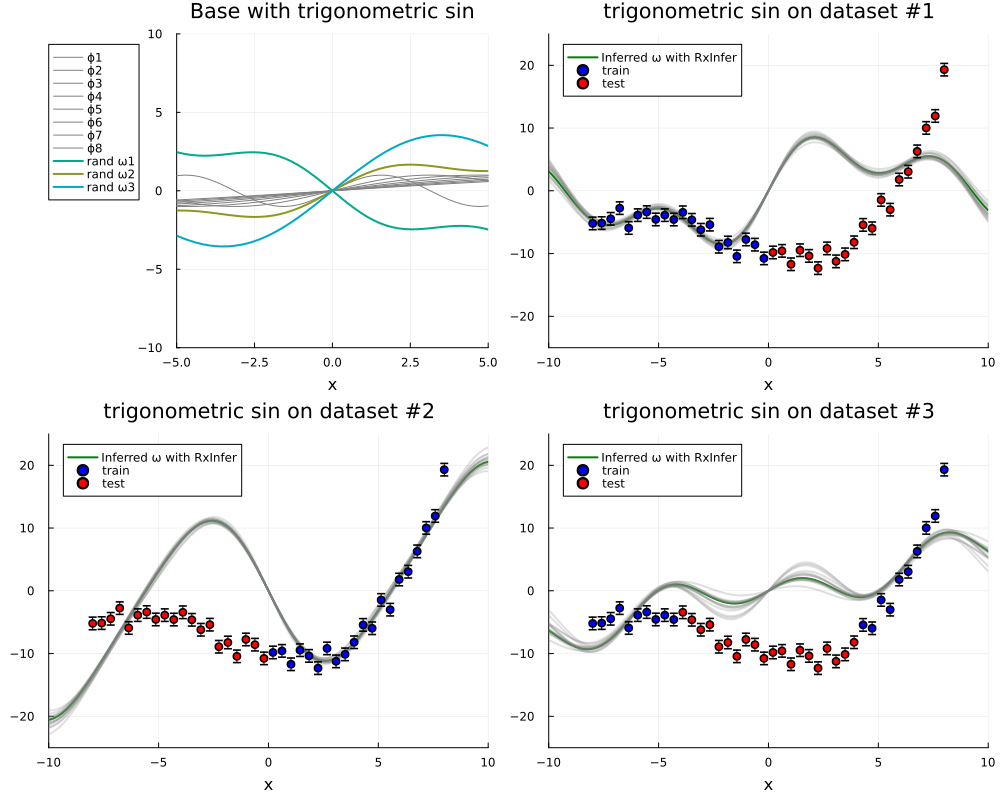

In [204]:
plot_inference_results_for(
    title    = "trigonometric sin",
    datasets = datasets,
    ϕs       = [ (x) -> sin(x / i) for i in 1:8 ], 
)

And here are the results for `cos`

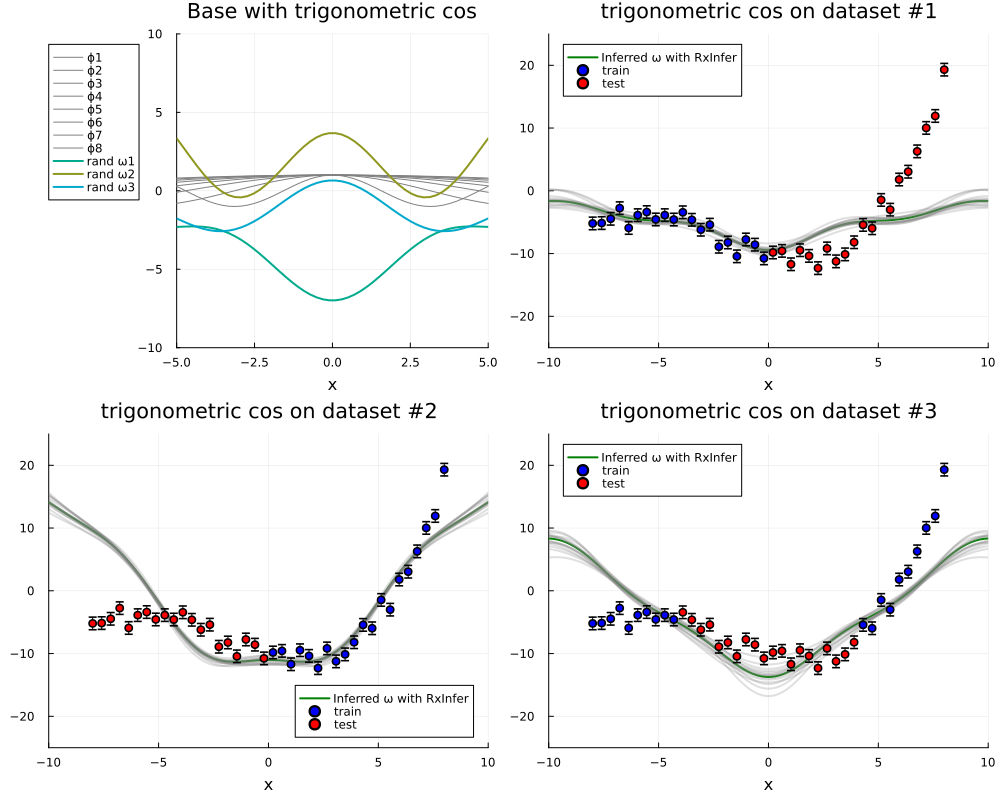

In [203]:
plot_inference_results_for(
    title    = "trigonometric cos",
    datasets = datasets,
    ϕs       = [ (x) -> cos(x / i) for i in 1:8 ], 
)

and we can even combine both!

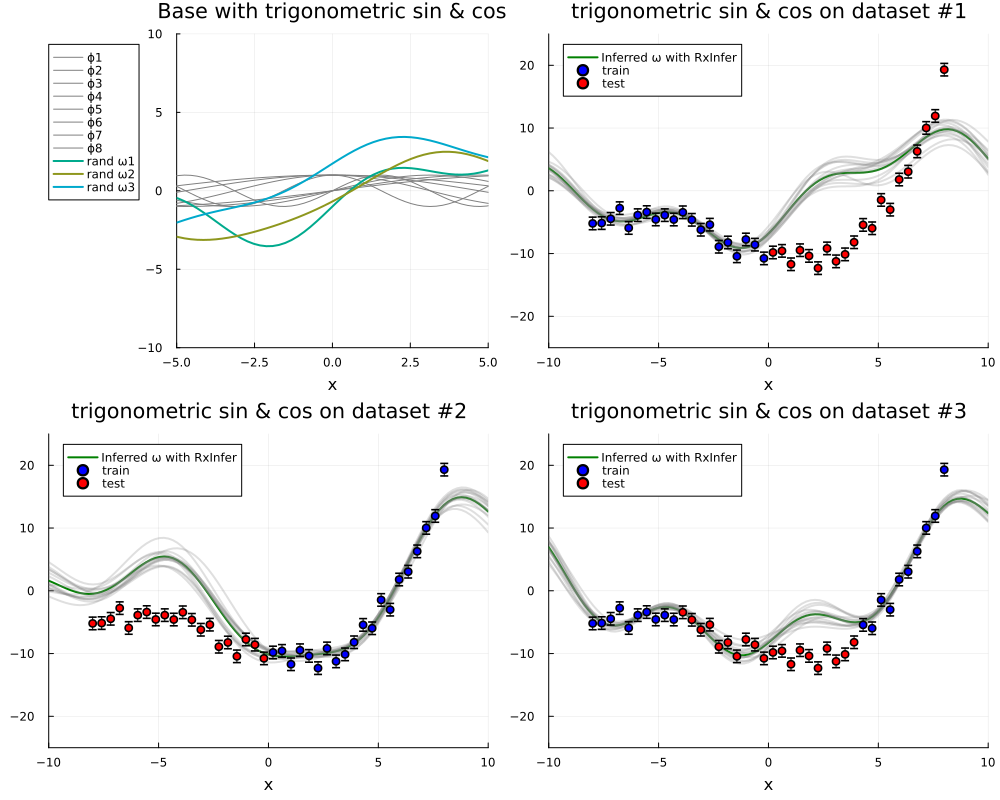

In [205]:
plot_inference_results_for(
    title    = "trigonometric sin & cos",
    datasets = datasets,
    ϕs       = [
        [ (x) -> sin(x / i) for i in 1:4 ]...,
        [ (x) -> cos(x / i) for i in 1:4 ]...,
    ], 
)

Wow! We didn't even need to change the model from RxInfer and it works nicely for completelly different choices of basis functions! The results are also neat! It seems like these combination of sin and cos functions performed much better for this particular example!

## Comparing log-evidence

Hm.. How about we use the Free-Energy values to quantify which basis functions were performing "better"? RxInfer computes Free-Energy (if requested) and acts a proxy to the negative log-evidence. The lower the value is better! Let's check the Free-Energy values both for polynomials and trigonometric functions.

In [215]:
function infer_ω_but_return_free_energy(; ϕs, x, y)
    result = infer(
        model = parametric_regression(
            ϕs = ϕs, 
            μ  = zeros(length(ϕs)),
            Σ  = I,
            Λ  = I,
            x  = x
        ), 
        data  = (y = y,),
        free_energy = true # <- here!
    )
    return first(result.free_energy) # lets ignore the actual posterior for now
end

infer_ω_but_return_free_energy (generic function with 1 method)

In [217]:
dfs = map(enumerate(datasets)) do (i, dataset)
    free_energy_sin = infer_ω_but_return_free_energy(
        ϕs = [ (x) -> sin(x / i) for i in 1:8 ],
        x  = dataset[:x_train],
        y  = dataset[:y_train]
    )

    free_energy_cos = infer_ω_but_return_free_energy(
        ϕs = [ (x) -> cos(x / i) for i in 1:8 ],
        x  = dataset[:x_train],
        y  = dataset[:y_train]
    )

    free_energy_sin_and_cos = infer_ω_but_return_free_energy(
        ϕs = [ 
            [ (x) -> sin(x / i) for i in 1:4 ]...,
            [ (x) -> cos(x / i) for i in 1:4 ]...,
        ],
        x  = dataset[:x_train],
        y  = dataset[:y_train]
    )

    return DataFrame(dataset = [ i, i, i ], fns = [ :sin, :cos, :sin_cos ], free_energy = [free_energy_sin, free_energy_cos, free_energy_sin_and_cos])
end

vcat(dfs...)

Row,dataset,fns,free_energy
,Int64,Symbol,Float64
1,1,sin,101.124
2,1,cos,53.0633
3,1,sin_cos,2704.55
4,2,sin,250.973
5,2,cos,256.811
6,2,sin_cos,2.59043e8
7,3,sin,120.074
8,3,cos,188.232
9,3,sin_cos,93.5025


From the results we may conclude that different choices of basis functions indeed play a significant role which is indicated in the different values of Free Energy function. We can see that for dataset number `1` its better to use the `cos` based basis functions (comparing to `sin` and `sin & cos`) while for dataset 3 `sin & cos` performed better.

But why stop on polynomials and trigonometric functions? Lets explore!

## Switch functions

Another popular choice for basis function is so-called _switch_ functions:

$$\begin{align}
\phi_i(x) = \mathrm{sign}(x - i)
\end{align}$$

and we have everything ready to see the result!

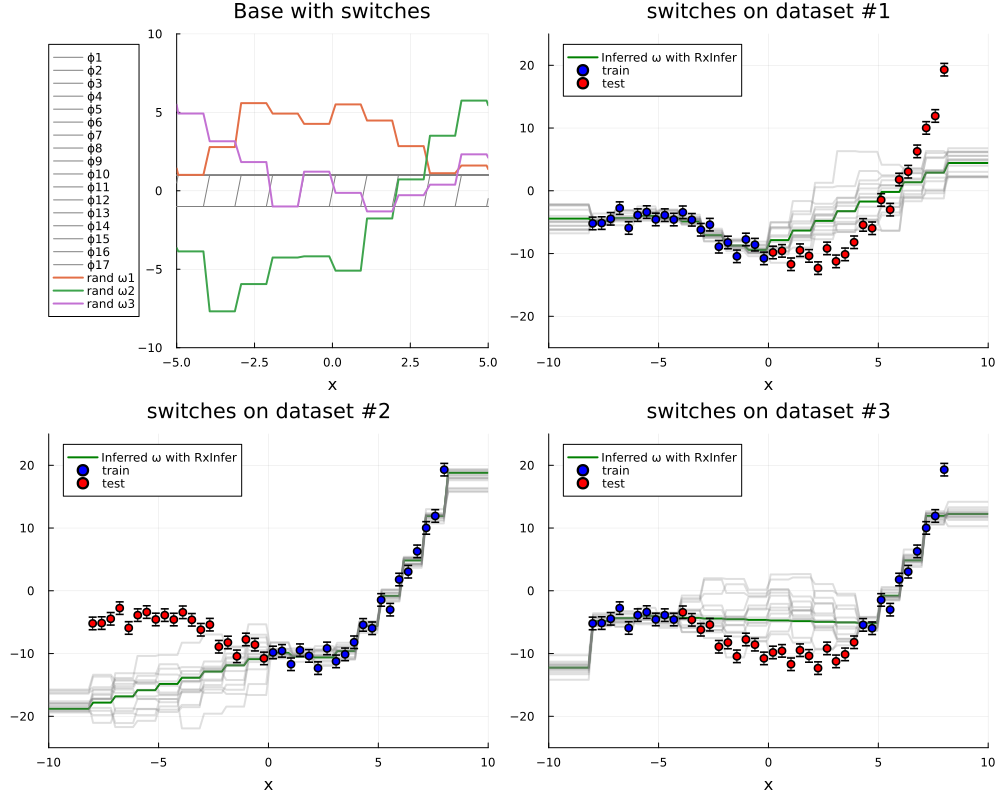

In [218]:
plot_inference_results_for(
    title    = "switches",
    datasets = datasets,
    ϕs       = [ (x) -> sign(x - i) for i in -8:8 ], 
)

## Step functions

How about step functions

$$\begin{align}
\phi_i(x) = \mathbb{I}(x - i > 0)
\end{align}

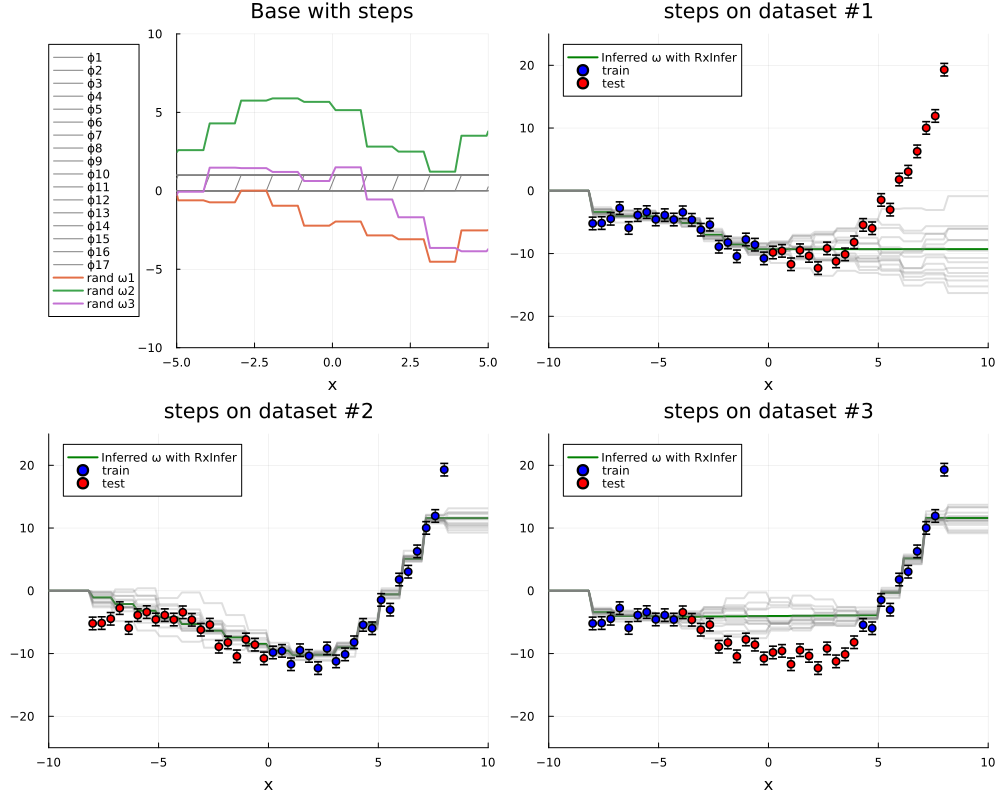

In [219]:
plot_inference_results_for(
    title    = "steps",
    datasets = datasets,
    ϕs       = [ (x) -> ifelse(x - i > 0, 1.0, 0.0) for i in -8:8 ], 
)

## Linear functions

Linear regression with linear functions? Why not??

$$\begin{align}
\phi_i(x) = \vert x - i \vert
\end{align}$$

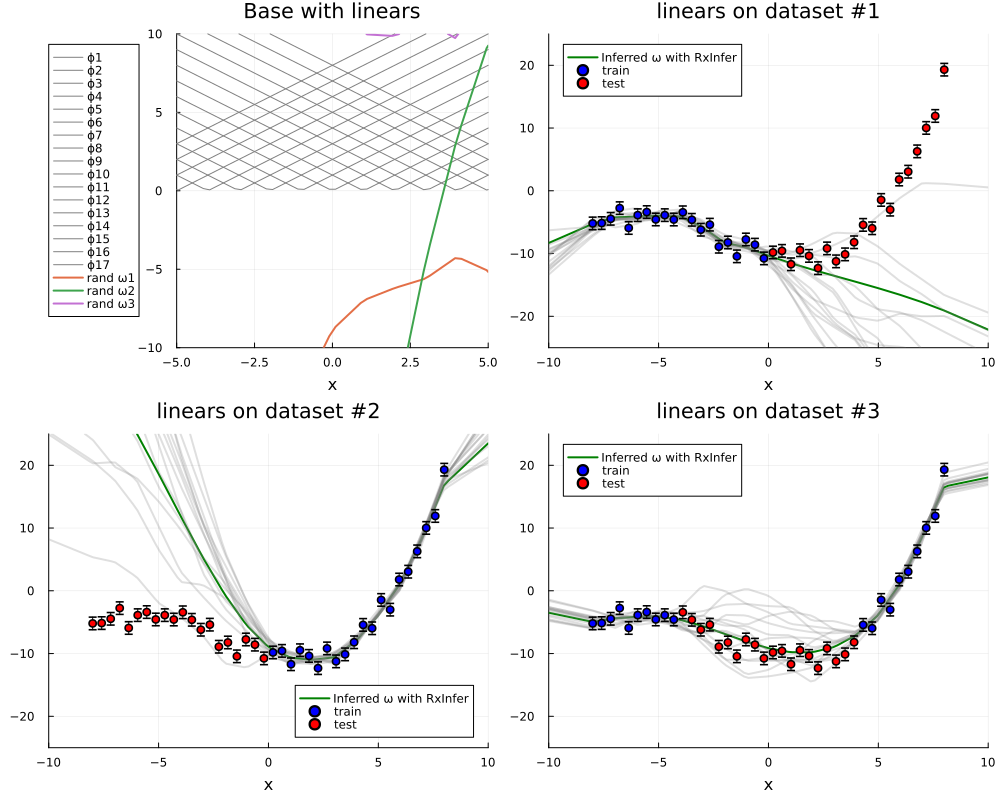

In [220]:
plot_inference_results_for(
    title    = "linears",
    datasets = datasets,
    ϕs       = [ (x) -> abs(x - i) for i in -8:8 ], 
)

## Absolute exponential

We could also try well known abs-exp functions:

$$\begin{align}
\phi_i(x) = e^{-\vert x - i \vert}
\end{align}$$

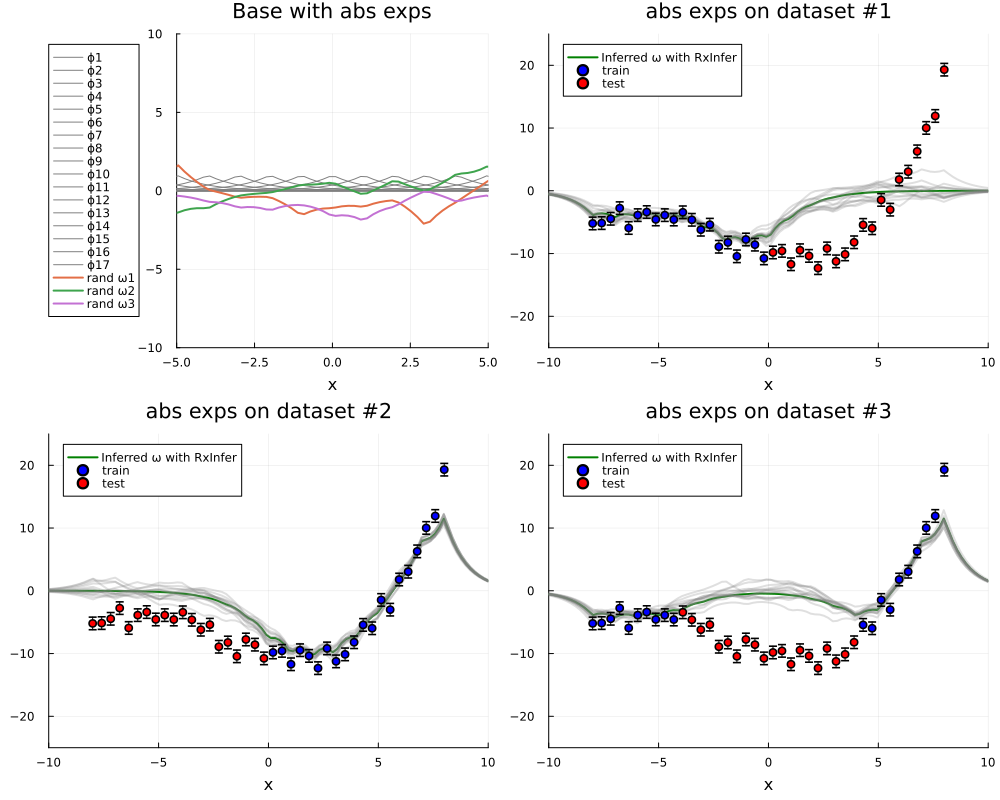

In [221]:
plot_inference_results_for(
    title    = "abs exps",
    datasets = datasets,
    ϕs       = [ (x) -> exp(-abs(x - i)) for i in -8:8 ], 
)

## Squared exponentials

Or squared exponentials? 

$$\begin{align}
\phi_i(x) = e^{-(x - i)^2}
\end{align}$$

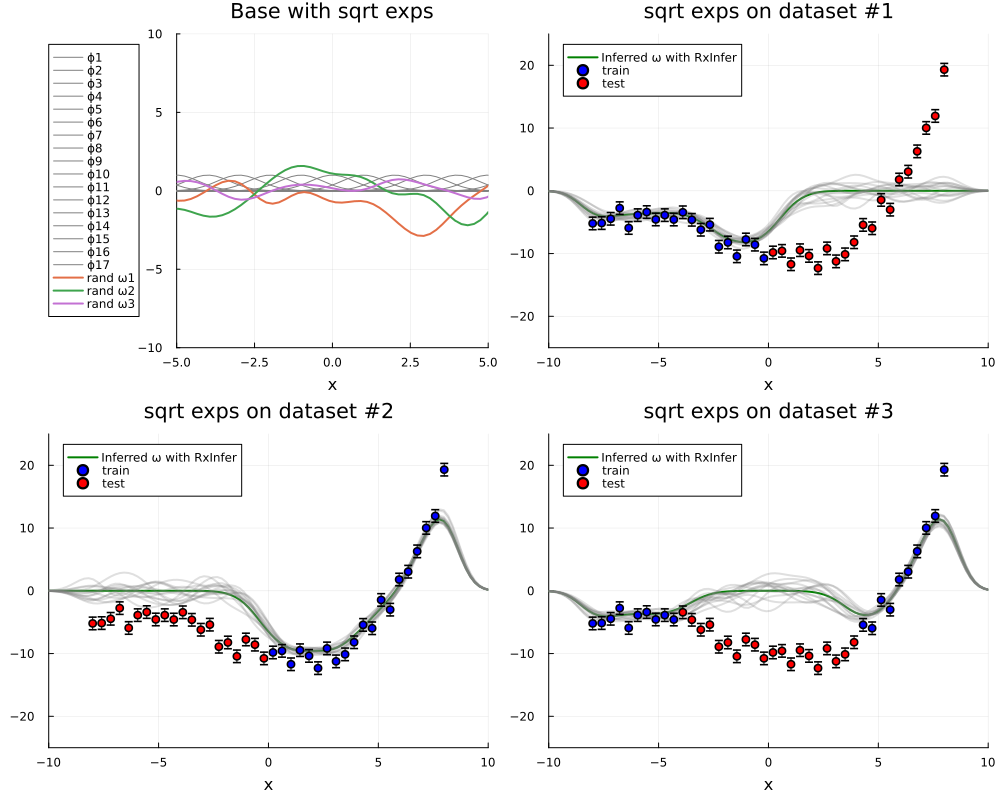

In [222]:
plot_inference_results_for(
    title    = "sqrt exps",
    datasets = datasets,
    ϕs       = [ (x) -> exp(-(x - i) ^ 2) for i in -8:8 ], 
)

## Sigmoids

How about sigmoids? 

$$\begin{align}
\phi_i(x) = \frac{1}{1 + e^{-3(x - 1)}}
\end{align}

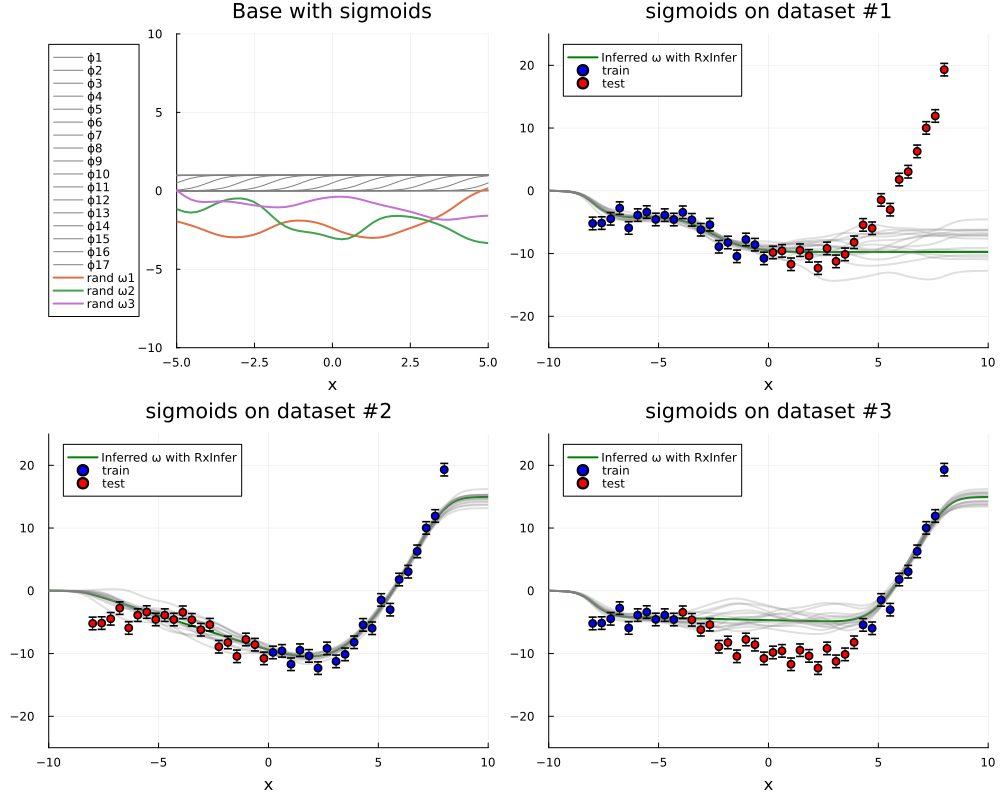

In [223]:
plot_inference_results_for(
    title    = "sigmoids",
    datasets = datasets,
    ϕs       = [ (x) -> 1 / (1 + exp(-3 * (x - i))) for i in -8:8 ], 
)

## Performance 

We could have fun experimenting with more different basis functions, especially given how fast does RxInfer perform the posterior calculations. Hm :D How about we check how long does it take to perform the inference? Let's use our lovely polynomials

In [225]:
using BenchmarkTools

In [227]:
@benchmark infer_ω(ϕs = $([ (x) -> x ^ i for i in 0:5 ]), x = $(datasets[1][:x_train]), y = $(datasets[1][:y_train]))

BenchmarkTools.Trial: 10000 samples with 1 evaluation per sample.
 Range (min … max):  63.208 μs …  19.110 ms  ┊ GC (min … max): 0.00% … 98.25%
 Time  (median):     67.000 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   73.539 μs ± 241.886 μs  ┊ GC (mean ± σ):  6.46% ±  2.17%

      ▃███▆▆▃▁                                                  
  ▁▂▄██████████▆▆▅▅▄▅▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▃
  63.2 μs         Histogram: frequency by time         87.1 μs <

 Memory estimate: 82.23 KiB, allocs estimate: 1438.

How about for a bigger dataset? Let's try with 10_000 datapoint?

In [233]:
N_benchmark = 10_000
X_benchmark = range(-8, 8, length=N_benchmark)
Y_benchmark = rand(rng, MvNormalMeanCovariance(f.(X_benchmark), Λ));

@benchmark infer_ω(ϕs = $([ (x) -> x ^ i for i in 0:5 ]), x = $(X_benchmark), y = $(Y_benchmark))

BenchmarkTools.Trial: 12 samples with 1 evaluation per sample.
 Range (min … max):  385.509 ms … 513.214 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     402.681 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   426.997 ms ±  49.729 ms  ┊ GC (mean ± σ):  0.00% ± 0.00%

  █                                                              
  █▁▁▆▁▆▁▁▁▁▆▁▁▁▁▁▁▁▆▁▁▁▁▁▁▁▁▁▁▁▆▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▆▁▁▁▆▁▁▁▁▆ ▁
  386 ms           Histogram: frequency by time          513 ms <

 Memory estimate: 1.15 MiB, allocs estimate: 1442.

Wow! That fast? Taking that small amount of memory? That's what I call scalable Bayesian inference!